# Part A

In [ ]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
plt.rcParams['figure.figsize'] = (8,6)

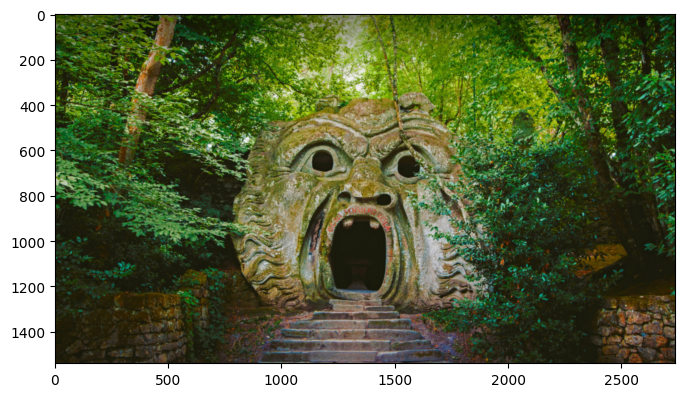

In [ ]:
#load and plot the image
original_img = cv2.imread('/content/OrcusMouth-blured.jpg')
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
plt.imshow(original_img)

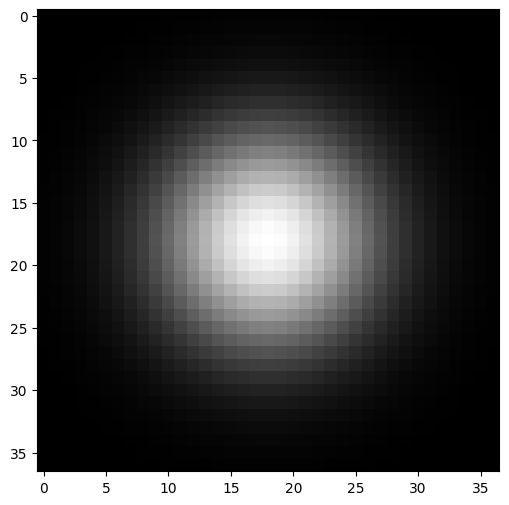

In [ ]:
#creating Gaussian filter
sigma = [3,4,5,6,7] #6
kernel_width = 6*sigma[3] + 1 
mean = (kernel_width - 1) / 2
gaussianFilter = np.zeros((kernel_width, kernel_width),dtype = np.float32)

for i in range(kernel_width):
  for j in range(kernel_width):
    gaussianFilter[i,j]=np.exp(-((i-mean)**2+(j-mean)**2)/(2*sigma[3] **2))
# normalizing the filter
gaussianFilter = gaussianFilter/np.sum(gaussianFilter)
#plot the filter
plt.imshow(gaussianFilter, cmap='gray')
#saving the filter as an image
# mpimg.imsave('result-08.jpg',gaussianFilter)

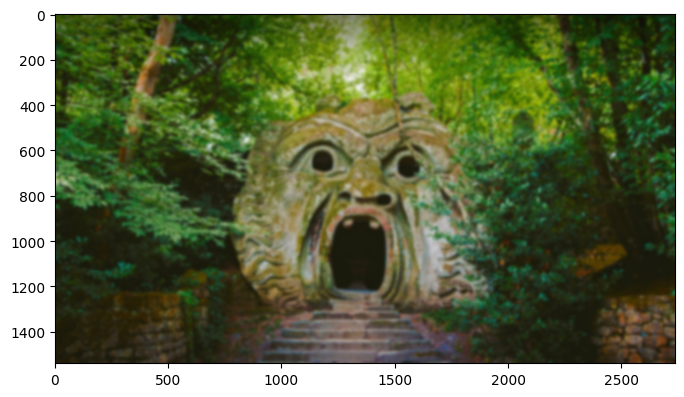

In [ ]:
#applying the guassian filter and creating a blure image
blured_img = cv2.filter2D(src=original_img, ddepth=-1, kernel= gaussianFilter ).astype(np.uint8)
#plitting the blured image
plt.imshow(blured_img)
#savimg the blured image
mpimg.imsave('result-09.jpg',blured_img)

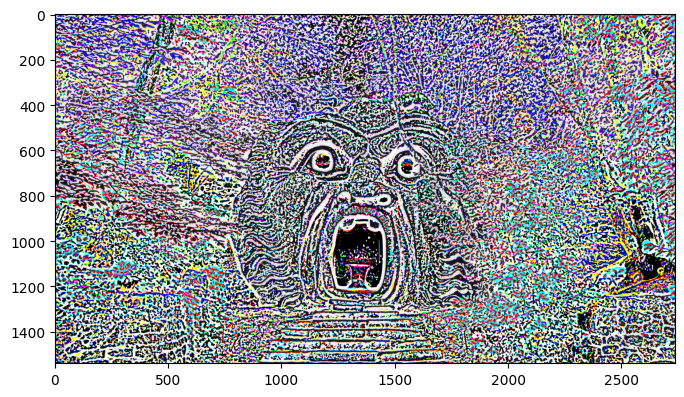

In [ ]:
# creating  an unsharp mask
unsharp_mask =original_img - blured_img
#plotting and saving the unsharp mask
plt.imshow(unsharp_mask)
mpimg.imsave('result-10.jpg',unsharp_mask)

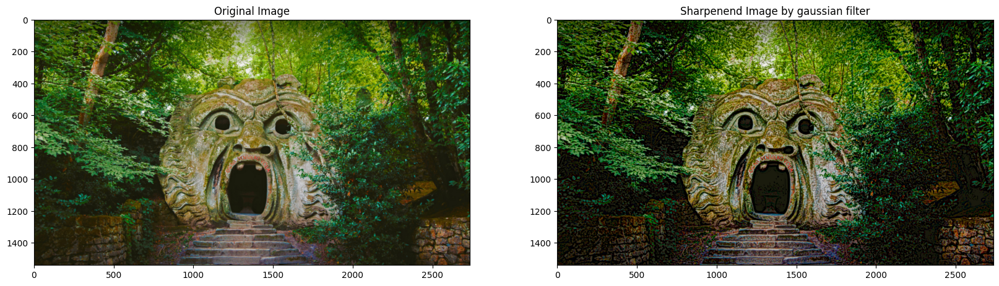

In [ ]:
#applying the image sharpening by gaussian filter
a = [0.1,0.15,0.2,0.3,0.4,0.5,0.6,0.7,0.8,1.5,3,6]
sharpened_image =original_img - a[1]*unsharp_mask
sharpened_image[sharpened_image < 0] = 0
sharpened_image[sharpened_image > 255] = 255
sharpened_image = sharpened_image.astype(np.uint8)
#plotting and saving the sharpened image
plt.rcParams['figure.figsize'] = (20,10)
fig , axs = plt.subplots(1,2)
axs[0].imshow(original_img)
axs[0].set_title("Original Image")
axs[1].imshow(sharpened_image)
axs[1].set_title('Sharpenend Image by gaussian filter')
mpimg.imsave('result-11.jpg',sharpened_image)

توضیحات:ابتدا فیلتر گوسی را میسازیم.برای انتخاب سایز فیلتر چون مقادیر قابل توجه نهایتا تا سه برابر انحراف معیار قرار دارند،سایز فیلتر را شش برابر انحراف معیار در نظر میگیریم.برای اتنخاب انحراف معیار،مقایر مختلف را تست کردیم تا تصویر به میزان قابل توجهی هموار شود.که درنهایت به مقدار 6 برای انحراف معیار رسیدیم.سایز فیلتز نیز 37در37پیسکل تعیین شده است.پس از ساخت فیلتر و هموار سازی تصویر،با توجه به رابطه داده شده،ماسک انشارپ را میسازیم.حال با استفاده از ماسک انشارپ ساخته شده به سراغ شارپ کردن تصویر مورد نظر میرویم.در این بخش بایستی میزان تاثیر ماسک انشارپ را که با ضریب الفا مدل شده است را تعیین کنیم.برای تعیین این ضریب مقادیر مختلف را تست کرده و در نهایت مقدار0.15 را در نظر گرفتیم.که تنیجه نسبتا خوبی را به ما میدهد.

# Part B

Sharpening by box filter

In [ ]:
#creating a box filter
kernel_width_list = [5,7,9,11,13,15,17,19]
kernel_width=kernel_width_list[6] #17
box_filter = np.ones(shape=(kernel_width, kernel_width)) / (kernel_width**2)

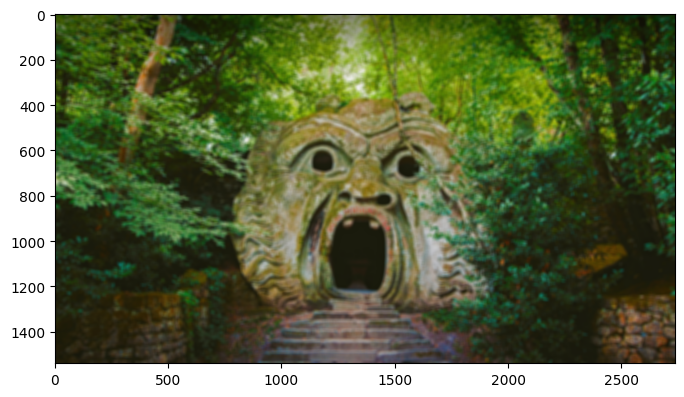

In [ ]:
#applying the box filter and creating a blure image
blured_img_box = cv2.filter2D(src=original_img, ddepth=-1, kernel= box_filter).astype(np.uint8)
#plitting the blured image
plt.rcParams['figure.figsize'] = (8,6)
plt.imshow(blured_img_box)
#saving the blured image
mpimg.imsave('result-12.jpg',blured_img_box)

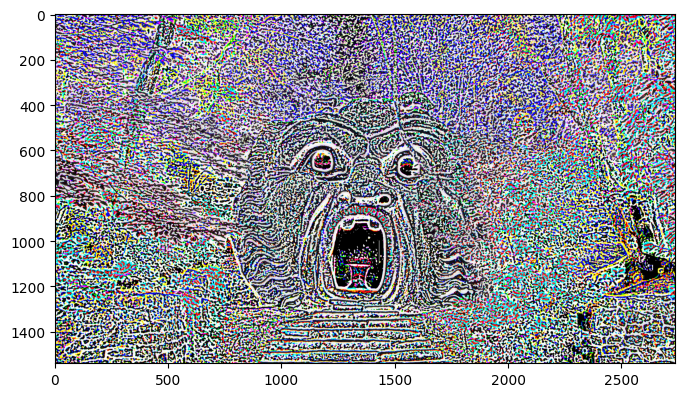

In [ ]:
# creating  an unsharp mask
unsharp_mask_box =original_img - blured_img_box
#plotting and saving the unsharp mask
plt.imshow(unsharp_mask_box)
mpimg.imsave('result-13.jpg',unsharp_mask_box)

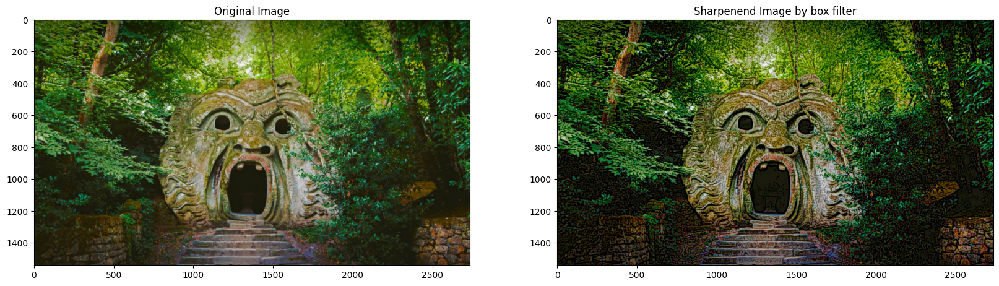

In [ ]:
#applying the image sharpening by box filter
a = [0.1,0.15,0.2,0.3,0.4,0.5,0.6,0.7,0.8,1.5,3,6]
sharpened_image_box =original_img - a[1]*unsharp_mask_box
sharpened_image_box[sharpened_image_box < 0] = 0
sharpened_image_box[sharpened_image_box > 255] = 255
sharpened_image_box = sharpened_image_box.astype(np.uint8)
#plotting and saving the sharpened image
plt.rcParams['figure.figsize'] = (20,10)
fig , axs = plt.subplots(1,2)
axs[0].imshow(original_img)
axs[0].set_title("Original Image")
axs[1].imshow(sharpened_image_box)
axs[1].set_title('Sharpenend Image by box filter')
mpimg.imsave('result-14.jpg',sharpened_image)

توضیحات:در این بخش نیز همان مراحل قسمت قبل را تکرار میکنیم با این تفاوت که بجای فیلتر گوسی از باکس فیلتر استفاده کردیم.برای تعیین ابعاد فیلتر مقادیر مختلف را تست کردیم تا تصویر به اندازه مناسبی هموار شود که در نهایت به ابعاد 17در17 پیکسل رسیدیم.حال با استفاده از این فیلتر،تصویر را هموار کرده و سپس ماسک انشارپ را میسازیم.همانند بخش قبل باسیتی ضریب الفا را تعیین کنیم.با توجه به اینکه تصویر هموار شده تقریبا مانند قسمت قبل شد،ضریب الفا را نیز مانند بخش قبل برابر 0.15 اتنخاب کردیم.همانطور که انتظار داشتیم،نتیجه به دست امده تا حدی مانند قسمت قبل شد.

# Part C

sharpening by Gaussain filter

Text(0.5, 1.0, 'Original Image FFT')

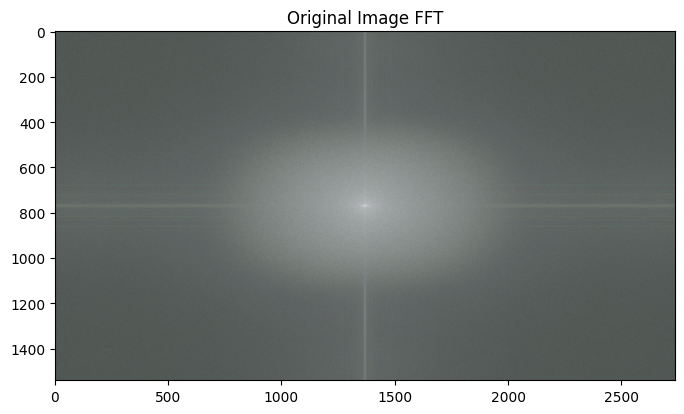

In [ ]:
#plotting and saving fft of the original image
shifted_image_fft_amplitude_normalized = np.zeros(original_img.shape)
# fig, axs = plt.subplots(1, 3,sharey=True)

# titles = ['Red Channel FFT' ,'Green Channel FFT' ,'Blue Channel FFT']
for i in range(3):
    image_fft = np.fft.fft2(original_img[:,:,i])
    shifted_image_fft = np.fft.fftshift(image_fft)
    shifted_image_fft_amplitude = np.log(np.abs(shifted_image_fft))
    shifted_image_fft_amplitude_normalized[:,:,i] = shifted_image_fft_amplitude - np.min(shifted_image_fft_amplitude)
    shifted_image_fft_amplitude_normalized[:,:,i] /= np.max(shifted_image_fft_amplitude_normalized[:,:,i])
plt.rcParams['figure.figsize'] = (8,6)
plt.imshow(255*shifted_image_fft_amplitude_normalized)
plt.title("Original Image FFT")
#saving the Image FFT
# mpimg.imsave('result-15.jpg',shifted_image_fft_amplitude_normalized)

Text(0.5, 1.0, 'Gaussian Filter In Frequency Domain')

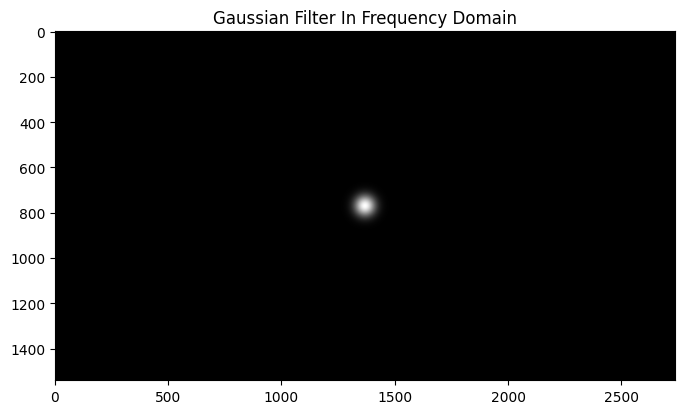

In [ ]:
#creating gaussian filter
guassain_ff_filter = np.zeros((original_img.shape[0],original_img.shape[1]) , dtype =float )
y_mean = original_img.shape[0]//2
x_mean = original_img.shape[1]//2
sigma = [3,5,6,7,8,9,10]
for j in range(original_img.shape[0]):
  for i in range(original_img.shape[1]):
    guassain_ff_filter[j,i] =np.exp( -((i-x_mean)**2 + (j-y_mean)**2)*2*(np.pi**2)*(0.005**2))
#plotting and saving the filter in frequancy domain
plt.rcParams['figure.figsize'] = (8,6)
plt.imshow(guassain_ff_filter  ,cmap ='gray')
plt.title("Gaussian Filter In Frequency Domain")
# mpimg.imsave('result-16.jpg',guassain_ff_filter)

Text(0.5, 1.0, 'Blured Image by Gaussian Filter')

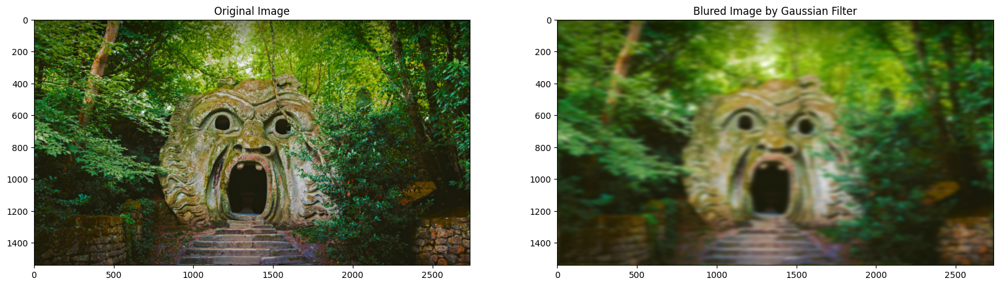

In [ ]:
# applying the gaussian filter and selecting the std of the filter
blr_g  = np.zeros(original_img.shape)
for i in range(3):
    image_fft = np.fft.fft2(original_img[:,:,i])
    shifted_image_fft = np.fft.fftshift(image_fft)
    filtered_image_fft = shifted_image_fft * guassain_ff_filter
    fil_im_ishifted = np.fft.ifftshift(filtered_image_fft)
    fil_im = np.fft.ifft2(fil_im_ishifted)
    blr_g[:,:,i]= np.real(fil_im)

blr_g =(blr_g-blr_g.min() ) / (blr_g.max()-blr_g.min()) * 255
plt.rcParams['figure.figsize'] = (20,10)
fig , axs = plt.subplots(1,2)
axs[0].imshow(original_img)
axs[0].set_title("Original Image")
axs[1].imshow(blr_g.astype(np.uint8))
axs[1].set_title('Blured Image by Gaussian Filter')

با توجه به نتیجه بالا،مقدلر 0.005 برای انحراف معیار فیلتر گوسی حوزه فرکانس مناسب بنظر میرسد.

Text(0.5, 1.0, 'Filtered Image FFT')

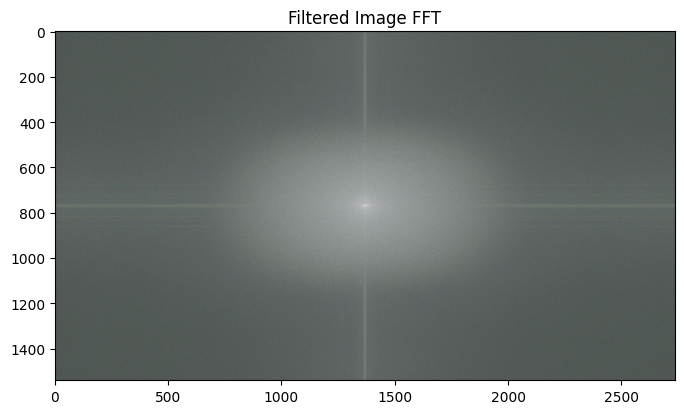

In [ ]:
#filtering the image
#selecting the k
result_g  = np.zeros(original_img.shape)
filtered_image_fft = np.zeros(original_img.shape  ,dtype=complex)
filtered_g_image_fft_amp_normal = np.zeros(original_img.shape)
for i in range(3):
    image_fft = np.fft.fft2(original_img[:,:,i])
    shifted_image_fft = np.fft.fftshift(image_fft)
    filtered_image_fft[:,:,i] = shifted_image_fft - 0.2* (shifted_image_fft -shifted_image_fft * guassain_ff_filter )  # F - k( F - F*G )
    #normalizing tha amplitude filtered_image_fft
    temp = np.log(np.abs(filtered_image_fft[:,:,i]))
    filtered_g_image_fft_amp_normal[:,:,i] = temp-temp.min()
    filtered_g_image_fft_amp_normal[:,:,i] /=np.max( filtered_g_image_fft_amp_normal[:,:,i])
    #FFT inverse (back to spatial domain)
    fil_im_ishifted = np.fft.ifftshift(filtered_image_fft[:,:,i])
    fil_im = np.fft.ifft2(fil_im_ishifted)
    result_g[:,:,i]= np.real(fil_im)

#plotting and saving the filtered image in frequancy domain
plt.rcParams['figure.figsize'] = (8,6)
plt.imshow(filtered_g_image_fft_amp_normal)
plt.title("Filtered Image FFT")
#saving the Filtered Image FFT
# mpimg.imsave('result-17.jpg',filtered_g_image_fft_amp_normal)

Text(0.5, 1.0, 'Sharpenend Image by Gaussian Filter')

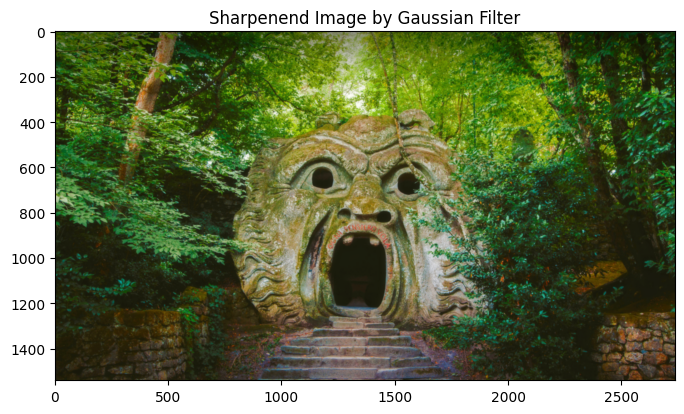

In [ ]:
#rescaling
result_g =(result_g-result_g.min() ) / (result_g.max()-result_g.min()) * 255
#plotting and saving the sharpened image
plt.rcParams['figure.figsize'] = (8,6)
plt.imshow(result_g.astype(np.uint8))
plt.title('Sharpenend Image by Gaussian Filter')
# mpimg.imsave('result-18.jpg',result_g.astype(np.uint8))

توضیحات:در این قسمت همان روند قسمت آ را دنبال میکنیم اما در حوزه فرکانس.ابتدا تصویر را در حوزه فرکانس بدست میاوریم.سپس معادل فرکانسی فیلتر گوسی را میسازیم.حال برای انتخاب انحراف معیار فیلتر گوسی از میزان هموار سازی ان روی تصویر کمک میگیریم و مقدار مناسب را انتخاب میکنیم.که در اینجا من مقدار0.005 را در نظر گرفتم.حال با استفاده ازین فیلتر،رابطه بخش قبل را در حوزه فرکانس پیاده سازی میکنیم.برای تعیین ضریب مقدار های مختلف را تست میکنیم تا تصویر خروجی به میزان خوبی شارپ شود.در اینجا من مقدار0.25 را انتخاب کردم.خروجی تقریبا مشابه  با قسمت آ شد.اما تفاوت ان ها در سرعت فیلتر کردن تصاویر میباشد.چراکه در حوزه مکان بایستی یک فیلتر گوسی با ابعاد17در17 را با تصویر اصلی کانولوشن کرد اما در حوزه فرکانس صرفا یک ضرب عنصر به عنصر بین دوماتریس هم سایز یعنی تصویر اصلی و فیلتر خواهیم داشت.بنابراین محاسبات به شدت کمتر خواهد بود و سرعت رسیدن به خروجی نهایی در حوزه فرکانس سریع تر خواهد بود.

# Part D

sharpening by high pass filter

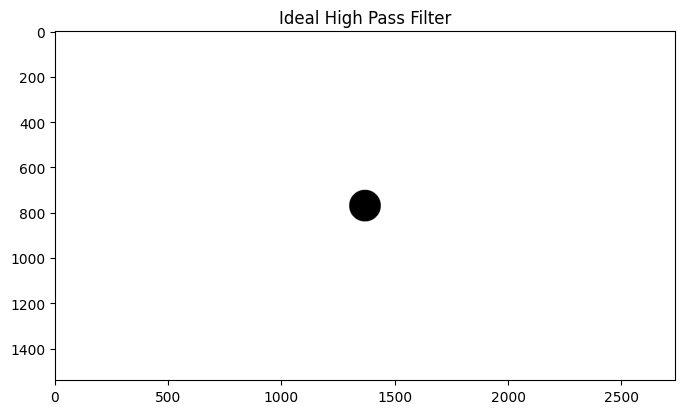

In [ ]:
#creating  Ideal high pass filter
radius =[10,20,30,40,50,60,70,90,100] #70
I_HP_filter = np.zeros((original_img.shape[0],original_img.shape[1]))
cy = I_HP_filter.shape[0] // 2
cx = I_HP_filter.shape[1] // 2
cv2.circle(I_HP_filter, (cx,cy), 70, (255,255,255), -1)[0]
I_HP_filter = (255 - I_HP_filter)  / 255
#plotting the filter
plt.rcParams['figure.figsize'] = (8,6)
plt.imshow(I_HP_filter , cmap = 'gray')
plt.title("Ideal High Pass Filter")
#saving the filter
# mpimg.imsave('result-19.jpg',I_HP_filter)

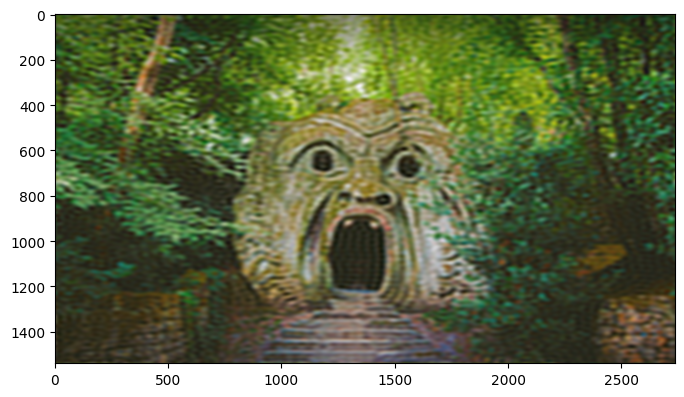

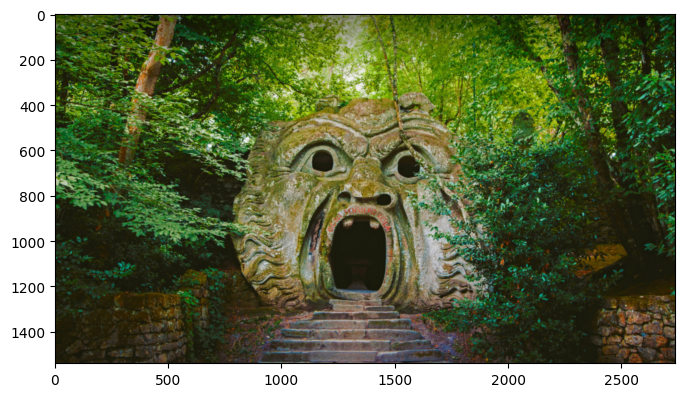

In [ ]:
blr  = np.zeros(original_img.shape)
for i in range(3):
    image_fft = np.fft.fft2(original_img[:,:,i])
    shifted_image_fft = np.fft.fftshift(image_fft)
    filtered_image_fft = shifted_image_fft * (1 - I_HP_filter)
    fil_im_ishifted = np.fft.ifftshift(filtered_image_fft)
    fil_im = np.fft.ifft2(fil_im_ishifted)
    blr[:,:,i]= np.real(fil_im)

blr =(blr-blr.min() ) / (blr.max()-blr.min()) * 255
plt.rcParams['figure.figsize'] = (8,6)
plt.imshow(blr.astype(int))
plt.figure()
plt.imshow(original_img )

برای تعیین اندازه باند گذر فیلتر های پس،از معادل پایین گذر آن که هموار سازی انجام میدهد استفاده کردیم.که با توجه به نتیجه بالا اندازه شعاع 70 اندازه خوبی بنظر میرسد. 

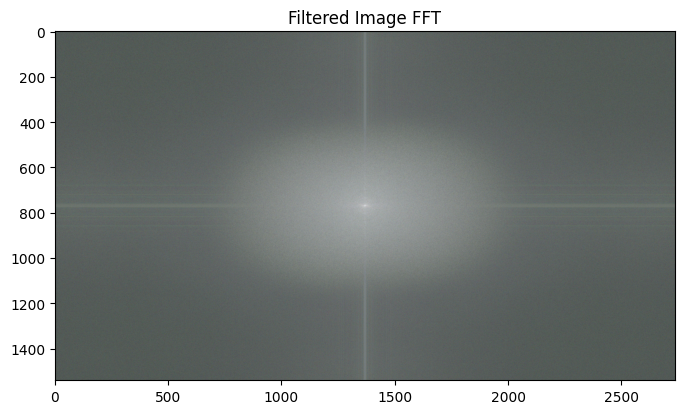

In [ ]:
#filtering  the image and plotting the filtered image in frequancy domain
#selecting the k
#(1+kI_HP_filter)F
k = [ 0.08,0.09 ,0.1,0.11,0.13,0.15,0.17 ,0.2 ]
result  = np.zeros(original_img.shape)
filtered_image_fft = np.zeros(original_img.shape  ,dtype=complex)
filtered_image_fft_amp_normal = np.zeros(original_img.shape)
for i in range(3):
    image_fft = np.fft.fft2(original_img[:,:,i])
    shifted_image_fft = np.fft.fftshift(image_fft)
    filtered_image_fft[:,:,i] = shifted_image_fft + 0.2* (shifted_image_fft * I_HP_filter) ##(1 + k * I_HP_filter) * F
    #normalizing tha amplitude filtered_image_fft
    temp = np.log(np.abs(filtered_image_fft[:,:,i]))
    filtered_image_fft_amp_normal[:,:,i] = temp-temp.min()
    filtered_image_fft_amp_normal[:,:,i] /=np.max( filtered_image_fft_amp_normal[:,:,i])
    #FFT inverse (back to spatial domain)
    fil_im_ishifted = np.fft.ifftshift(filtered_image_fft[:,:,i])
    fil_im = np.fft.ifft2(fil_im_ishifted)
    result[:,:,i]= np.real(fil_im)


#plotting the filtered image in frequancy domain
plt.rcParams['figure.figsize'] = (8,6)
plt.imshow(filtered_image_fft_amp_normal)
plt.title("Filtered Image FFT")
#saving the Filtered Image FFT
mpimg.imsave('result-20.jpg',filtered_image_fft_amp_normal)

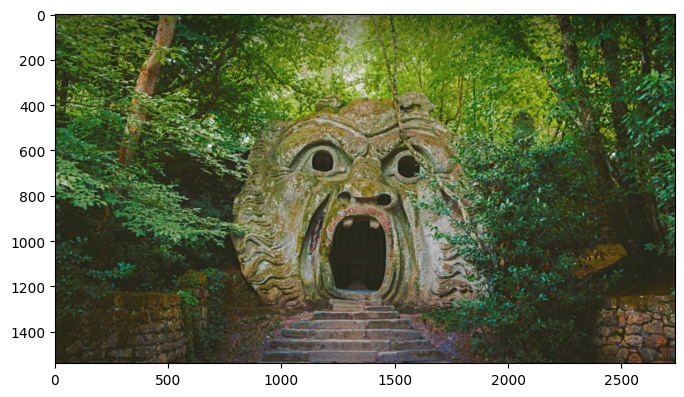

In [ ]:
#rescaling
result =(result-result.min() ) / (result.max()-result.min()) * 255
#plotting and saving the sharpened image
plt.imshow(result.astype(np.uint8))
mpimg.imsave('resullt-21.jpg',result.astype(np.uint8))

توضیحات:در این قسمت با استفاده از یک فیلتر بالاگذر تصویر را شارپ میکنیم.پس از ساخت فیلتر که بالاتد توصیح دادیم،حال با توجه به رابطه داده شده در سوال تصویر را فیلتر میکنیم.برای انتخاب ضریب مناسب مقادیر مختلف را تست کردیم تا به نتیجه مطلوبی برسیم.در اینجا من مقدار 0.2 را در نظر گرفتم.اما در کل نتیجه بدست امده در قسمت های قبل تا حدی بهتر و شارپ تر از این قسمت بود.